# MSBA SMA Assignment #1

### Group 2: Stiles Clements, Muskan Khepar, Keerti Rawat, Nikhil Kumar, Zan Merrill


The learning objectives for this assignment are to learn ways to
* Detect social “influencers” using network analytics
* Quantify the financial value of influence
* Identify and leverage influencers

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

## Part I: Find predictors of influence

### (A) Influencer Classification

Social influence is a multifaceted concept that cannot be determined by a single metric; therefore, we use comparative analysis to distinguish true influencers from regular users.

**Objective:** To develop a high-accuracy binary classification model that identifies the more influential individual in a pair and to isolate the specific predictors that contribute most to social influence.


**Dataset Used:**
The "Predict Who is More Influential" dataset from Kaggle, consisting of paired observations ($A$ and $B$) with 11 distinct Twitter-based activity and network variables for each person

**Methodology:**
> *Feature Engineering*: Applied a logarithmic transformation ($\log(1+x)$) to handle the long-tailed distribution of social media metrics and calculated the difference (log$A - logB$) for each feature to capture relative influence.

>*Data Normalization*: Utilized MinMaxScaler to scale all resulting features into a strict range of $0$ to $1$, ensuring equal weight during model training.

>*Model Training*: Implemented a Logistic Regression model with L2 regularization ($C=0.1$) and the liblinear solver to classify pairs and extract feature coefficients.

>*Evaluation*: Assessed the model using a confusion matrix to identify True Positives and False Positives for subsequent financial value calculations


In [46]:
df=pd.read_csv("https://raw.githubusercontent.com/AHMerrill/various-public-project-datasets/main/train.csv")
df.shape

(5500, 23)

In [47]:
df.head(10)

,Choice,A_follower_count,A_following_count,A_listed_count,A_mentions_received,A_retweets_received,A_mentions_sent,A_retweets_sent,A_posts,A_network_feature_1,...,B_following_count,B_listed_count,B_mentions_received,B_retweets_received,B_mentions_sent,B_retweets_sent,B_posts,B_network_feature_1,B_network_feature_2,B_network_feature_3
0,0,228,302,3,0.583979,0.100503,0.100503,0.100503,0.362150,2,...,29808,1689,15.430498,3.984029,8.204331,0.332423,6.988815,66,75.530303,1916.893939
1,0,21591,1179,228,90.456506,25.798292,5.709329,1.111159,5.176620,369,...,848,1610,40.495021,8.943607,3.227677,0.564343,1.070321,163,132.030675,2931.515337
2,0,7310,1215,101,25.503644,9.556347,5.361519,0.591206,3.589718,95,...,482,206,0.734696,0.354379,0.603202,0.100503,0.603202,3,10.333333,277.333333
3,0,20,7,2,7.690824,0.277306,1.331508,0.100503,2.830627,6,...,17637,278,572.874856,390.293681,27.552040,7.167557,32.101906,1762,23.469296,1395.845634
4,1,45589,862,2641,148.854279,36.998884,27.881768,3.333492,23.861282,551,...,1711,181,21.601866,3.581661,6.764657,1.119727,4.563246,85,48.500000,1993.627907
5,0,285735,276251,3417,19.327582,7.292016,0.100503,0.100503,0.100503,60,...,1500,474,40.592512,5.923009,19.648064,1.861765,12.261029,128,107.431818,2481.136364
6,0,285735,276251,3417,19.327582,7.292016,0.100503,0.100503,0.100503,60,...,1001,15117,266.013874,54.345230,13.111904,0.334766,13.665173,928,172.986229,5321.646186
7,1,9512,12,213,52.167068,23.182288,0.362150,0.100503,6.806045,195,...,710,959,7.368643,2.088375,1.598798,0.595812,1.332849,29,205.533333,4302.466667
8,1,2273871,4524,11946,6782.405338,2944.524245,12.955723,2.791861,66.206208,21678,...,551,6209,493.256379,206.660552,4.115212,0.854539,3.075463,2021,75.970098,3865.446569
9,0,182598,1402,3831,145.844910,74.002958,23.549189,0.100503,15.953243,567,...,1299,9950,189.755230,67.310223,11.294831,2.567269,10.933766,791,185.542033,5535.939774


In [48]:
#renaming for better interpretation
rename_dict = {
    'A_network_feature_1': 'A_degree',
    'A_network_feature_2': 'A_betweenness',
    'A_network_feature_3': 'A_closeness',
    'B_network_feature_1': 'B_degree',
    'B_network_feature_2': 'B_betweenness',
    'B_network_feature_3': 'B_closeness'
}

# Apply the change
df.rename(columns=rename_dict, inplace=True)

Text(0.5, 0, 'Followers (Raw Scale)')

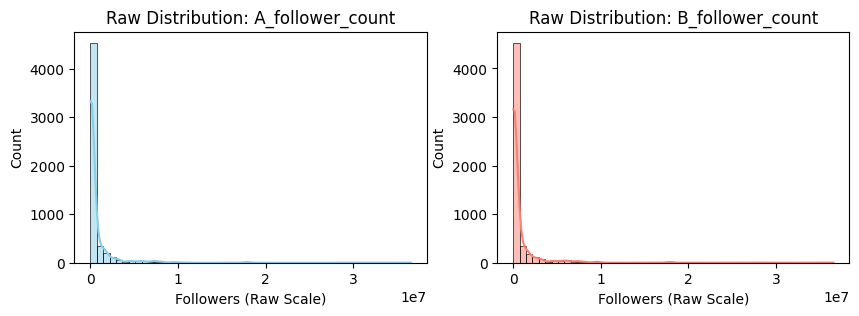

In [49]:
#checking the data distribution by visualizing
#Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

# Plot 1: Raw Data Distribution for A
sns.histplot(df['A_follower_count'], bins=50, ax=ax1, color='skyblue', kde=True)
ax1.set_title('Raw Distribution: A_follower_count')
ax1.set_xlabel('Followers (Raw Scale)')
# Plot 1: Raw Data Distribution for B
sns.histplot(df['B_follower_count'], bins=50, ax=ax2, color='salmon', kde=True)
ax2.set_title('Raw Distribution: B_follower_count')
ax2.set_xlabel('Followers (Raw Scale)')



We see a single massive bar at the beginning and almost nothing else. This is because the "celebrities" in the data have so many followers that the x-axis has to stretch incredibly far, making the "average" users look like they have zero.


As the data was highly skewed, by applying np.log1p, we will change the scale to "orders of magnitude".


Text(0.5, 0, 'Followers (Log Scale)')

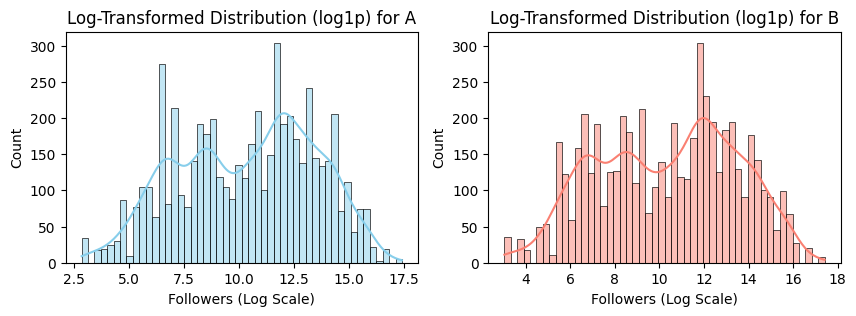

In [50]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

# Plot 1: The Log-Transformed Data (Normal Distribution) for A
sns.histplot(np.log1p(df['A_follower_count']), bins=50, ax=ax1, color='skyblue', kde=True)
ax1.set_title('Log-Transformed Distribution (log1p) for A')
ax1.set_xlabel('Followers (Log Scale)')

# Plot 2: The Log-Transformed Data (Normal Distribution) for B
# This squashes the outliers so the model can learn from everyone, not just celebrities
sns.histplot(np.log1p(df['B_follower_count']), bins=50, ax=ax2, color='salmon', kde=True)
ax2.set_title('Log-Transformed Distribution (log1p) for B')
ax2.set_xlabel('Followers (Log Scale)')


  Now, the data looks like a bell curve. Logistic Regression performs much better when the data is distributed this way because it doesn't get "distracted" by the extreme outliers.

  We retain all variables for completeness, but based on model evaluation, we'll interpret coefficients near zero as limited incremental value.

In [51]:
# Listed 11 base feature names based on the column headers
feature_names = [
    'follower_count', 'following_count', 'listed_count', 'mentions_received',
    'retweets_received', 'mentions_sent', 'retweets_sent', 'posts',
    'degree', 'betweenness', 'closeness'
]

# Apply log transformation to all feature columns for both A and B
df_log = df.copy()
for col in df.columns:
    if col != 'Choice':
        df_log[col] = np.log1p(df[col])

# Create a new dataframe for the differences (A - B)
X = pd.DataFrame()
for feat in feature_names:
    # This captures the relative gap between A and B
    X[f'diff_{feat}'] = df_log[f'A_{feat}'] - df_log[f'B_{feat}']

# Target variable: Who is actually more influential?
y = df['Choice']

Using log($A) - log(B$) simplifies the problem for the model by giving it a single number that represents the gap in popularity or activity. It can be interpreted as relative advantage feature of all the varibales.

In [52]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the scaler to range between 0 and 1 as per assignment instructions
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit the scaler to the data and transform it
# This converts every value into a relative score between 0 and 1
X_normalized = scaler.fit_transform(X)

# Convert back to a DataFrame for easier visualization and coefficient mapping
X_final = pd.DataFrame(X_normalized, columns=X.columns)

# Display the first few rows to verify the 0-1 range
X_final.head()

,diff_follower_count,diff_following_count,diff_listed_count,diff_mentions_received,diff_retweets_received,diff_mentions_sent,diff_retweets_sent,diff_posts,diff_degree,diff_betweenness,diff_closeness
0,0.286926,0.321901,0.211996,0.395273,0.425942,0.250627,0.478400,0.329000,0.370118,0.533201,0.576533
1,0.461471,0.516758,0.404486,0.527539,0.542894,0.554226,0.570043,0.605662,0.530664,0.320751,0.454697
2,0.512856,0.540297,0.462917,0.609370,0.592537,0.661825,0.582913,0.601675,0.627507,0.614559,0.637842
3,0.214873,0.198699,0.283139,0.317043,0.228944,0.205857,0.139981,0.291534,0.270884,0.306957,0.365703
4,0.556153,0.476574,0.621928,0.574087,0.595441,0.654236,0.647559,0.644721,0.573489,0.546539,0.508835


In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report

# Use C=0.1 to prevent overfitting and liblinear for robust performance on small datasets
# 'penalty=l2' is the standard for social media data where most features matter
best_model = LogisticRegression(C=0.1, solver='liblinear', penalty='l2')

# Train the model on the normalized data
best_model.fit(X_final, y)

# Get predictions to evaluate the model
y_pred = best_model.predict(X_final)

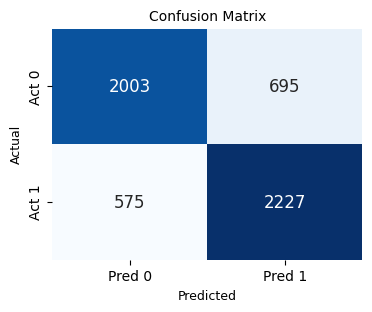

In [54]:
#creating confusion matrix
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate values
tn, fp, fn, tp = confusion_matrix(y, y_pred).ravel()
cm_data = [[tn, fp], [fn, tp]]
plt.figure(figsize=(4, 3))
sns.heatmap(cm_data, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={"size": 12},
            xticklabels=['Pred 0', 'Pred 1'],
            yticklabels=['Act 0', 'Act 1'])

plt.title('Confusion Matrix', fontsize=10)
plt.ylabel('Actual', fontsize=9)
plt.xlabel('Predicted', fontsize=9)
plt.show()

**Confusion Matrix Results:**

TN=2003, FP=695, FN=575, TP=2227 (N=5500).  

Accuracy = 76.9%.

For predicting class 1 (“A more influential”), Precision = 76.2% and Recall = 79.5%.

In [55]:
# Create a mapping of feature names to their model coefficients
# X.columns contains the names of the 'diff_' features
importance = pd.DataFrame({
    'Feature': X.columns,
    'Weight': best_model.coef_[0]
})

# Sort by the absolute value of the weight to see the most 'powerful' predictors
importance['Abs_Weight'] = importance['Weight'].abs()
importance = importance.sort_values(by='Abs_Weight', ascending=False)

print(importance[['Feature', 'Weight']])

                   Feature    Weight
2        diff_listed_count  2.710196
0      diff_follower_count  2.086416
8              diff_degree  1.497962
3   diff_mentions_received  1.094249
4   diff_retweets_received  1.016684
9         diff_betweenness  0.839789
5       diff_mentions_sent  0.540633
1     diff_following_count -0.453061
7               diff_posts -0.419912
10          diff_closeness  0.061548
6       diff_retweets_sent  0.026029


/tmp/ipython-input-2032788504.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Weight', y='Feature', data=importance, palette='viridis')


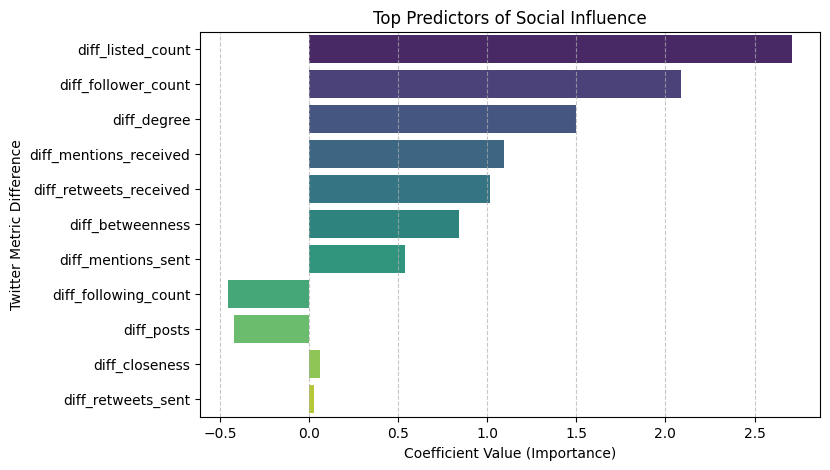

In [56]:
plt.figure(figsize=(8, 5))
sns.barplot(x='Weight', y='Feature', data=importance, palette='viridis')
plt.title('Top Predictors of Social Influence')
plt.xlabel('Coefficient Value (Importance)')
plt.ylabel('Twitter Metric Difference')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

**Top Predictors**:
> diff_listed_count: clearly the most important factor by coefficient magnitude. Being "listed" by other users is a powerful form of social curation, suggesting that a user is an authority in a specific topic.

>Second Predictor: diff_follower_count follows closely. While we discussed that "normal people" matter, raw reach is still a major component of influence in this model.


>Network Features: diff_degree is also a high-impact predictor, indicating that a user’s position within a social web (who they are connected to) is a better indicator of influence than simply how many posts they create.

**Analysis and Key Findings:**

>The model is trained on pairwise differences (diff_*), so a positive coefficient indicates that when A’s metric exceeds B’s, the probability that A is classified as more influential increases.

>The strongest predictors are social proof and earned engagement: diff_listed_count and diff_follower_count are the largest positive drivers, followed by network position (diff_degree, diff_betweenness) and engagement received (diff_mentions_received, diff_retweets_received).

>“Activity” metrics are weaker signals: diff_posts and diff_following_count have negative coefficients, suggesting that high posting volume or following many users does not necessarily translate into higher influence once amplification and curation signals are controlled for.

>Some predictors contribute little incremental information (coefficients near zero), such as diff_closeness and diff_retweets_sent, indicating limited marginal value relative to the dominant features above.

>Model Performance: The model achieves ~76.9% accuracy (4,230/5,500 correct). Errors are split between 695 false positives (predicting A is more influential when B is) and 575 false negatives (missing cases where A is truly more influential). From a business standpoint, false positives correspond to wasted incentive spend, while false negatives represent missed high-ROI influencers, so the decision threshold can be tuned based on whether cost control or coverage is the priority.


**Recommendations:**
> *Strategic Resource Allocation*: Instead of a "spray and pray" approach, the business can use the model to prioritize users who show strong social proof (listed_count, follower_count) and network centrality (degree/betweenness), since these features most strongly increase the probability a user is classified as more influential in pairwise comparisons.

>*Cost-Benefit Optimization*: The negative coefficient on diff_posts suggests that, after controlling for social proof and engagement received, higher posting volume alone is not a strong signal of influence. A business should avoid paying "loud" users who post frequently but lack engagement or social proof (lists/followers), as they are likely not true influencers.


>*Targeting Logic*: By using these weights, a business can create an automated "Influence Score" to decide which users qualify for the $\$10$ "two-tweet" promotion, ensuring a higher probability of ROI compared to paying everyone \$5.

>*Model governance*: Use the confusion matrix to choose a threshold that balances wasted spend (false positives) vs missed influencers (false negatives), and periodically retrain as the social graph and user behavior evolves.

### (B) Financial Value of the Model



***Objective:***

The objective is to quantify the financial value of using an influencer prediction model.
Specifically, we aim to estimate the expected net profit for a retailer when using our logistic regression model to identify social media influencers, compare it with a scenario where no analytics is used, and determine the lift in profit.

***Methodology:***

Attach predictions to data: Using the logistic regression model from Part 1A, each user pair is classified as influencer or non-influencer.

_Label outcomes:_ Each pair is categorized as True Positive (TP), False Positive (FP), False Negative (FN), or True Negative (TN) based on actual vs predicted influence.

_Assign follower counts:_ The true influencer in each pair is identified and their follower count is used to calculate potential reach.

_Define economic parameters:_ Profit per unit, tweet probabilities, and costs for each scenario (no analytics, model-based, perfect model)

*Assumptions + Notations:*

* **Profit per purchase** = \$10
* **Buy probability (1 tweet)** = ($p_1$ = 0.0001) (0.01%)
* **Buy probability (2 tweets)** = ($p_2$ = 0.00015) (0.015%)
* **Fixed cost per pair** = $\$10$ (we pay both users $\$5$ each)


* (F_i) = follower count of the **true influencer** in pair (i)
* We compute (F_i) using our `np.where()` logic:

  * If `Choice=1` → influencer is A → use `A_follower_count`
  * If `Choice=0` → influencer is B → use `B_follower_count`

So:
$$
F_i=\begin{cases}
A_followers_i & \text{if Choice}=1\\
B_followers_i & \text{if Choice}=0
\end{cases}
$$

*Calculate expected profit:*

Let's use expected purchases = $F_i \cdot p$, and expected profit = purchases $\cdot $10$.

**Scenario 1: No Analytics**

Everyone is paid, true influencer tweets once:
$$
\text{Profit}^{(No)}_i = (F_i \cdot p_1 \cdot 10) - 10
$$

**Scenario 2: Model-based**

Let $I_i = 1$ if the model **picked the true influencer** for pair (i), else 0:
$$
\text{Profit}^{(Model)}_i = I_i \cdot (F_i \cdot p_2 \cdot 10) - 10
$$

* Correct pick → we get boosted conversion (2 tweets)
* Wrong pick → revenue term is 0, but cost still applies

**Scenario 3: Perfect Model**

Always picks true influencer; all get 2 tweets:
$$
\text{Profit}^{(Perfect)}_i = (F_i \cdot p_2 \cdot 10) - 10
$$

Then total expected net profit is just:
$$
\text{Total Profit}=\sum_i \text{Profit}_i
$$


*Compute Lift:*

Define lifts:
$$
\text{Lift}_{Model}=\text{Total}_{Model}-\text{Total}_{No}
$$
$$
\text{Lift}_{Perfect}=\text{Total}_{Perfect}-\text{Total}_{No}
$$
And “% of perfect achieved”:

$$
\%\text{Perfect Achieved}=\frac{\text{Lift}_{Model}}{\text{Lift}_{Perfect}}
$$

_Interpret results:_ Analyzing how using the model improves financial outcomes and demonstrating the value of predictive influencer analytics.

In [57]:
# Economic parameters
profit_per_unit = 10.0
p_one_tweet     = 0.0001   # 0.01%
p_two_tweets    = 0.00015  # 0.015%

#  true influencer followers (RAW follower counts, not log)
#np.where(condition, x, y) returns an array that picks from x where the condition is True, otherwise from y.
true_inf_followers = np.where(df['Choice'].values == 1, df['A_follower_count'].values,df['B_follower_count'].values)


*  Each purchase earns the retailer $10 profit.
*  If an influencer tweets once, the probability a follower buys is 0.01%.
*  If they tweet twice, the probability increases to 0.015%.

The np.where() line identifies the true influencer in each A-B pair using the Choice column.

If Choice = 1, then A is the more influential user, so we take A_follower_count.

If Choice = 0, then B is the more influential user, so we take B_follower_count.


The result, true_inf_followers, is a vector containing the actual follower counts of the real influencers for every row. This is needed to compute expected revenue.




In [58]:
# Scenario 1: No Analytics
rev_no   = true_inf_followers * p_one_tweet * profit_per_unit
cost_no  = np.full(shape=len(df), fill_value=10.0)
#cost_no - Creates a vector where every pair costs $10: $5 paid to A and $5 paid to B
prof_no  = rev_no - cost_no
total_no = prof_no.sum()
#total_no - Adds up the per‑pair profits across all rows in df (i.e., all A–B pairs)

In [59]:
print(f"Expected Net profit for No Analytics: ${total_no:,.2f}")

Expected Net profit for No Analytics: $5,321,568.59


In [60]:
#  Scenario 2: Model
correct_mask = (y_pred == y)
#A Boolean array that is True for rows where classifier’s prediction matches the ground truth.
rev_model = np.where(correct_mask,
                     true_inf_followers * p_two_tweets * profit_per_unit,
                     0.0)
#If correct_mask=True: the retailer selected the true influencer, who sends two tweets
#If correct_mask=False: the retailer picked the wrong person, so revenue is 0
cost_model  = np.full(shape=len(df), fill_value=10.0)
#Creates a cost vector with $10 per pair, it happens regardless of whether mask was true or false
prof_model  = rev_model - cost_model
#prof_model - Computes per‑pair expected net profit under the model: revenue minus the fixed $10 cost.
total_model = prof_model.sum()

In [61]:
print (f"Expected Net Profit for Model Based: ${total_model:,.2f}")

Expected Net Profit for Model Based: $7,423,521.11


In [62]:
# Scenario 3: Perfect Model
# Always selects the true influencer - two tweets and $10 cost per pair
rev_perfect = true_inf_followers * p_two_tweets * profit_per_unit
cost_perf   = np.full(shape=len(df), fill_value=10.0)
prof_perf   = rev_perfect - cost_perf
total_perf  = prof_perf.sum()

In [63]:
lift_model   = total_model - total_no
lift_perfect = total_perf  - total_no

summary = pd.DataFrame({
    "Scenario": ["No Analytics", "Model-based", "Perfect Model"],
    "Expected Net Profit": [total_no, total_model, total_perf]
})


**Display Result**

In [64]:
# Build summary with formatted values
summary = pd.DataFrame({
    "Scenario": ["No Analytics", "Model-based", "Perfect Model"],
    "Expected Net Profit": [
        f"${total_no:,.2f}",
        f"${total_model:,.2f}",
        f"${total_perf:,.2f}"
    ]
})

print(summary)
lift_model_pct = (total_model - total_no) / total_no * 100
lift_perf_pct  = (total_perf - total_no) / total_no * 100

print(f"Lift (Model vs No Analytics): ${lift_model:,.2f} ({lift_model_pct:.2f}%)")
print(f"Lift (Perfect vs No Analytics): ${lift_perfect:,.2f} ({lift_perf_pct:.2f}%)")

        Scenario Expected Net Profit
0   No Analytics       $5,321,568.59
1    Model-based       $7,423,521.11
2  Perfect Model       $8,009,852.89
Lift (Model vs No Analytics): $2,101,952.52 (39.50%)
Lift (Perfect vs No Analytics): $2,688,284.30 (50.52%)


**Key Findings:**

The model-based approach increases expected net profit from $\$5.32M$ (no analytics) to $\$7.42M$, delivering an incremental lift of +$\$2.10M$ (approximately +39.5% vs. baseline).

A perfect model would generate $\$8.01M$, so the current model captures about 78% of the total attainable uplift (7.42−5.32/8.01−5.32≈0.78) leaving roughly $\$0.59M$ of additional upside.

**Analysis:**

The profit lift comes from using analytics to target higher-value users, those with strong social proof and amplification signals which increases the likelihood of realizing the higher two-tweet conversion rate (0.015%).

Remaining losses are largely driven by classification errors: false positives waste incentive spend on low-impact users, while false negatives represent missed opportunities to invest in high-ROI influencers. Tightening the decision threshold could reduce wasted spend if budget efficiency is the priority.


## Part II: Finding influencers from Twitter

### (A) Parsing the tweets to create network


**Objective:**
The first goal for this section is to parse tweets.  The parsed file is then available for download into csv to be used in graphing software such as NodeXL and Gephi, but we also use PyVis below for visualization.

**Dataset Used:**
tweets_sample.csv

**Methodology:**
We use regex + basic python / pandas to parse in the following way:

    Parse tweets into a directed attention / interaction edge list suitable
    for network analysis and Gephi visualization.

    OUTPUT (Gephi-friendly edge list):
        - Source  : user who authored the tweet
        - Target  : user receiving attention
        - Content : one of {Tweet, RT, Reply, Mention}

    DEFINITIONS OF EDGE TYPES:
        - Tweet   : A self-loop indicating authored content (user → user)
        - RT      : A retweet edge indicating amplification of another user
        - Reply   : A direct conversational response to one or more users
        - Mention : A non-conversational reference to another user

    HARD INVARIANTS (ENFORCED IN ONE PASS):
        1. Every tweet produces exactly ONE Tweet self-loop for its author.
        2. Every retweet has EXACTLY ONE RT target:
              → the first @handle following 'RT'
        3. Every user who is EVER retweeted MUST have a Tweet self-loop,
           even if they never appear as an author in the dataset.
        4. All other @handles in a retweet are Mentions, NOT RTs.
        5. Replies may target multiple users (all leading @handles).
        6. Mentions may target multiple users (non-leading @handles).

    PARSING PRECEDENCE (TOP TO BOTTOM):
        1. Retweet
        2. Original authored tweet (self-loop)
        3. Reply
        4. Mention

    IMPORTANT MODELING NOTE:
        This parser models *attention flow*, not Twitter’s internal mechanics.
        Retweet self-loops for original authors represent evidence of authored
        content, not duplicated tweets.

    PARAMETERS:
        df : pandas.DataFrame
             Must contain columns {'screen_name', 'text'}

    RETURNS:
        pandas.DataFrame with columns:
            ['Source', 'Target', 'Content']

In [65]:
import pandas as pd
import re
from typing import List, Optional

In [66]:
# read the data into a data frame

url = "https://raw.githubusercontent.com/AHMerrill/various-public-project-datasets/main/tweets_sample.csv"
df2 = pd.read_csv(url)

df2.head()


,ids,screen_name,followers,retweet,inreplyto,favorite,friends,listed,location,text
0,1.405351e+08,nytherapy,162,0,NaN,0,564,13,New York City,Patience (or is it Fortitude?) decked out in m...
1,1.182370e+18,StToes,849,43,NaN,0,2189,0,NaN,RT @CaptainLives: Did you wear a mask at Thank...
2,1.852520e+09,NormanisShining,270,0,NaN,0,219,0,NaN,#HappyThanksgiving! We socially distanced (eve...
3,1.005190e+18,luvelisee,535,0,NaN,1,691,0,ga,nigel one funny mf @Ibechillin3 he said before...
4,1.252443e+09,travel5762,12747,747,NaN,0,12971,12,Somewhere Out South,RT @donwinslow: Florida governor Ron DeSantis ...


In [67]:
def parse_tweet_edges_with_selfloops(df: pd.DataFrame) -> pd.DataFrame:
    """
    Parse tweets into a directed attention / interaction edge list suitable
    for network analysis and Gephi visualization.

    OUTPUT (Gephi-friendly edge list):
        - Source  : user who authored the tweet
        - Target  : user receiving attention
        - Content : one of {Tweet, RT, Reply, Mention}

    DEFINITIONS OF EDGE TYPES:
        - Tweet   : A self-loop indicating authored content (user → user)
        - RT      : A retweet edge indicating amplification of another user
        - Reply   : A direct conversational response to one or more users
        - Mention : A non-conversational reference to another user

    HARD INVARIANTS (ENFORCED IN ONE PASS):
        1. Every tweet produces exactly ONE Tweet self-loop for its author.
        2. Every retweet has EXACTLY ONE RT target:
              → the first @handle following 'RT'
        3. Every user who is EVER retweeted MUST have a Tweet self-loop,
           even if they never appear as an author in the dataset.
        4. All other @handles in a retweet are Mentions, NOT RTs.
        5. Replies may target multiple users (all leading @handles).
        6. Mentions may target multiple users (non-leading @handles).

    PARSING PRECEDENCE (TOP TO BOTTOM):
        1. Retweet
        2. Original authored tweet (self-loop)
        3. Reply
        4. Mention

    IMPORTANT MODELING NOTE:
        This parser models *attention flow*, not Twitter’s internal mechanics.
        Retweet self-loops for original authors represent evidence of authored
        content, not duplicated tweets.

    PARAMETERS:
        df : pandas.DataFrame
             Must contain columns {'screen_name', 'text'}

    RETURNS:
        pandas.DataFrame with columns:
            ['Source', 'Target', 'Content']
    """

    USER_RE = re.compile(r'@([A-Za-z0-9_]{1,15})')
    LEADING_MENTIONS_RE = re.compile(r'^\s*(?:@([A-Za-z0-9_]{1,15})\s*)+')
    RT_START_RE = re.compile(r'^\s*["“”]?RT\b', re.IGNORECASE)

    required = {"screen_name", "text"}
    missing = required - set(df.columns)
    if missing:
        raise ValueError(f"df is missing required columns: {missing}")

    def extract_all_handles(text: str) -> List[str]:
        return USER_RE.findall(text)

    def extract_leading_reply_handles(text: str) -> List[str]:
        m = LEADING_MENTIONS_RE.match(text)
        if not m:
            return []
        return USER_RE.findall(m.group(0))

    rows = []
    selflooped = set()  # tracks users who already have a Tweet self-loop

    for _, r in df.iterrows():
        author = r["screen_name"]
        text_raw = r["text"]

        # -----------------------------
        # Handle missing text
        # -----------------------------
        if pd.isna(text_raw):
            if author not in selflooped:
                rows.append((author, author, "Tweet"))
                selflooped.add(author)
            continue

        text = str(text_raw).strip()
        handles = extract_all_handles(text)

        # -----------------------------
        # Retweet (highest priority)
        # -----------------------------
        if RT_START_RE.match(text) and handles:
            rt_target = handles[0]  # ONLY one true retweet target

            # Ensure original author has authored-content self-loop
            if rt_target not in selflooped:
                rows.append((rt_target, rt_target, "Tweet"))
                selflooped.add(rt_target)

            # RT edge to original author
            rows.append((author, rt_target, "RT"))

            # Remaining handles are Mentions
            for h in handles[1:]:
                rows.append((author, h, "Mention"))

            continue

        # -----------------------------
        # Original authored tweet
        # -----------------------------
        if author not in selflooped:
            rows.append((author, author, "Tweet"))
            selflooped.add(author)

        # -----------------------------
        # Reply
        # -----------------------------
        if text.startswith("@"):
            targets = extract_leading_reply_handles(text) or handles
            seen = set()
            for h in targets:
                if h not in seen:
                    seen.add(h)
                    rows.append((author, h, "Reply"))
            continue

        # -----------------------------
        # Mentions
        # -----------------------------
        seen = set()
        for h in handles:
            if h not in seen:
                seen.add(h)
                rows.append((author, h, "Mention"))

    return pd.DataFrame(rows, columns=["Source", "Target", "Content"])

In [68]:
parsed=parse_tweet_edges_with_selfloops(df2)

In [69]:
parsed

,Source,Target,Content
0,nytherapy,nytherapy,Tweet
1,CaptainLives,CaptainLives,Tweet
2,StToes,CaptainLives,RT
3,NormanisShining,NormanisShining,Tweet
4,luvelisee,luvelisee,Tweet
...,...,...,...
6466,dunnclan,SenKamalaHarris,RT
6467,pig_marvin,nypost,RT
6468,pjensen2010,BarackObama,RT
6469,isabethner,Cleavon_MD,RT


In [70]:
parsed['Content'].value_counts()

,count
Content,
Tweet,2328
RT,2317
Reply,1438
Mention,388


### This section checks that each user who is the target of a RT also has a self-loop

In [71]:
# users who were targets of RT edges
rt_targets = set(
    parsed.loc[parsed["Content"] == "RT", "Target"]
)

In [72]:
# users with a self-loop (Tweet)
self_loop_users = set(
    parsed.loc[
        (parsed["Source"] == parsed["Target"]) &
        (parsed["Content"] == "Tweet"),
        "Source"
    ]
)

In [73]:
missing_selfloops = rt_targets - self_loop_users

print(f"Retweeted users: {len(rt_targets)}")
print(f"Users with Tweet self-loops: {len(self_loop_users)}")
print(f"Retweeted users missing self-loop: {len(missing_selfloops)}")

Retweeted users: 842
Users with Tweet self-loops: 2328
Retweeted users missing self-loop: 0


### This section exports the file to csv for upload into NodeXL, Gephi or other graphing software

In [74]:
# parsed.to_csv(
#     "parsed_tweets_edges.csv",
#     index=False,
#     encoding="utf-8"
# )

# from google.colab import files
# files.download("parsed_tweets_edges.csv")

### (B) Creating the Network and the metrics

Here we use NetworkX to create a network and obtain various centrality measures, and PyVis to visualize it in different ways.


In [75]:
import networkx as nx
import pandas as pd

In [76]:
# ============================================================
# GRAPH TYPE SELECTION (READ THIS FIRST)
# ============================================================
# Choose how edge multiplicity should be handled.
#
# GRAPH_TYPE = "multi"
#   - Uses nx.MultiDiGraph
#   - Each row in `parsed` is ONE interaction event
#   - Multiple edges between the same (Source, Target) are preserved
#   - Edge strength emerges from multiplicity (counts)
#   - BEST when:
#       * We export raw edges to Gephi / NodeXL
#       * We want parity across tools
#       * We want to derive weights later (optionally)
#
# GRAPH_TYPE = "simple"
#   - Uses nx.DiGraph
#   - At most ONE edge per (Source, Target)
#   - Edge existence only (binary adjacency)
#   - Multiplicity is collapsed implicitly
#   - BEST when:
#       * We care only about topology, not frequency
#       * We want faster algorithms on large graphs
#
GRAPH_TYPE = "multi"   # <-- change to "simple" if desired

# ============================================================
# BUILD DIRECTED GRAPH
# ============================================================

if GRAPH_TYPE == "multi":
    G = nx.MultiDiGraph()
elif GRAPH_TYPE == "simple":
    G = nx.DiGraph()
else:
    raise ValueError("GRAPH_TYPE must be 'multi' or 'simple'")

G.add_edges_from(parsed[["Source", "Target"]].itertuples(index=False))

print(f"Nodes: {G.number_of_nodes()}")
print(f"Edges: {G.number_of_edges()}")

# ============================================================
# CENTRALITY MEASURES (UNWEIGHTED)
# ============================================================

# Degree semantics:
#   - MultiDiGraph: degree = number of interaction events
#   - DiGraph     : degree = number of unique neighbors

in_degree = dict(G.in_degree())
out_degree = dict(G.out_degree())

# total degree = in + out
total_degree = {
    n: in_degree.get(n, 0) + out_degree.get(n, 0)
    for n in G.nodes()
}

betweenness = nx.betweenness_centrality(G, normalized=True)
closeness = nx.closeness_centrality(G)
pagerank = nx.pagerank(G)

# ============================================================
# COMBINE INTO TABLE
# ============================================================

nodes = list(G.nodes())

centrality_df = pd.DataFrame({
    "node": nodes,

    "in_degree": [in_degree.get(n, 0) for n in nodes],
    "in_degree_norm": [0.0 for _ in nodes],

    "out_degree": [out_degree.get(n, 0) for n in nodes],
    "out_degree_norm": [0.0 for _ in nodes],

    "total_degree": [total_degree.get(n, 0) for n in nodes],
    "total_degree_norm": [0.0 for _ in nodes],

    "betweenness": [betweenness.get(n, 0.0) for n in nodes],
    "betweenness_norm": [0.0 for _ in nodes],

    "closeness": [closeness.get(n, 0.0) for n in nodes],
    "closeness_norm": [0.0 for _ in nodes],

    "pagerank": [pagerank.get(n, 0.0) for n in nodes],
    "pagerank_norm": [0.0 for _ in nodes],
})

# ============================================================
# NORMALIZATION (MIN–MAX → [0,1])
# ============================================================

def minmax_norm(series: pd.Series) -> pd.Series:
    smin = float(series.min())
    smax = float(series.max())
    if smax - smin <= 0:
        return pd.Series([0.0] * len(series), index=series.index)
    return (series - smin) / (smax - smin)

centrality_df["in_degree_norm"] = minmax_norm(centrality_df["in_degree"])
centrality_df["out_degree_norm"] = minmax_norm(centrality_df["out_degree"])
centrality_df["total_degree_norm"] = minmax_norm(centrality_df["total_degree"])
centrality_df["betweenness_norm"] = minmax_norm(centrality_df["betweenness"])
centrality_df["closeness_norm"] = minmax_norm(centrality_df["closeness"])
centrality_df["pagerank_norm"] = minmax_norm(centrality_df["pagerank"])

# ============================================================
# SORT + PREVIEW
# ============================================================

SORT_BY = "in_degree"
# options:
# in_degree, in_degree_norm
# out_degree, out_degree_norm
# total_degree, total_degree_norm
# betweenness, betweenness_norm
# closeness, closeness_norm
# pagerank, pagerank_norm

centrality_df = centrality_df.sort_values(SORT_BY, ascending=False)
display(centrality_df.head(20))

# ============================================================
# EXPORT (optional)
# ============================================================

# centrality_df.to_csv("centrality_by_person.csv", index=False)
# print("Saved: centrality_by_person.csv")

Nodes: 5846
Edges: 6471


,node,in_degree,in_degree_norm,out_degree,out_degree_norm,total_degree,total_degree_norm,betweenness,betweenness_norm,closeness,closeness_norm,pagerank,pagerank_norm
16,BarackObama,165,1.000000,1,0.055556,166,1.000000,0.0,0.0,0.027887,1.000000,0.033010,1.000000
44,DrEricDing,133,0.806061,1,0.055556,134,0.806061,0.0,0.0,0.021900,0.785323,0.022666,0.686305
27,Oobahs,120,0.727273,1,0.055556,121,0.727273,0.0,0.0,0.018477,0.662577,0.022001,0.666134
73,Boringstein,64,0.387879,1,0.055556,65,0.387879,0.0,0.0,0.010265,0.368098,0.012406,0.375141
403,Cleavon_MD,52,0.315152,1,0.055556,53,0.315152,0.0,0.0,0.008212,0.294479,0.009634,0.291068
95,SenKamalaHarris,44,0.266667,1,0.055556,45,0.266667,0.0,0.0,0.007186,0.257669,0.008627,0.260538
180,kylegriffin1,41,0.248485,1,0.055556,42,0.248485,0.0,0.0,0.006501,0.233129,0.007735,0.233475
1326,BBhuttoZardari,35,0.212121,1,0.055556,36,0.212121,0.0,0.0,0.005646,0.202454,0.006829,0.206020
1573,btsarmy2018x,33,0.200000,1,0.055556,34,0.200000,0.0,0.0,0.005475,0.196319,0.006728,0.202945
46,GovRonDeSantis,33,0.200000,0,0.000000,33,0.193939,0.0,0.0,0.005646,0.202454,0.000512,0.014438


### Next we display the entire network.  Node size is determined by degree, and edge thickness is determined by frequency of interaction.  This is not necessarily useful by itself, but could be used to determine which areas should be further examined.  

In [77]:
!pip install pyvis

In [78]:
# @title
# ======================================================
# PYVIS — COLAB INLINE
# ======================================================

import networkx as nx
from pyvis.network import Network
from IPython.display import HTML
from collections import Counter


In [79]:
# ======================================================
# FULL ATTENTION NETWORK (PYVIS, CPU-SAFE)
# ======================================================

import networkx as nx
from pyvis.network import Network
from IPython.display import HTML
from collections import Counter
from pathlib import Path

# ======================================================
# GRAPH TUNABLE
# ======================================================
# Change this if you want multiple full graphs side-by-side

GRAPH_NAME = "G1"

# ======================================================
# VISUAL TUNABLES
# ======================================================

MIN_EDGE_COUNT = 1        # keep all real interactions
MAX_NODE_SIZE = 40
MIN_NODE_SIZE = 6

ENABLE_PHYSICS = True
PHYSICS_RUNTIME_MS = 45000   # hard stop after render (ms)

OUTPUT_HTML = f"{GRAPH_NAME}_full_attention_network_pyvis.html"

# ======================================================
# BUILD EVENT-LEVEL GRAPH (AUTHORITATIVE)
# ======================================================

G = nx.MultiDiGraph()
G.add_edges_from(parsed[["Source", "Target"]].itertuples(index=False))

print(
    f"Full graph ({GRAPH_NAME}): {G.number_of_nodes()} nodes, "
    f"{G.number_of_edges()} edges (events)"
)

# ======================================================
# COLLAPSE MULTI-EDGES → COUNTS (VISUALIZATION PROJECTION)
# ======================================================

edge_counts = Counter()
for u, v in G.edges():
    edge_counts[(u, v)] += 1

edge_counts = {
    (u, v): c
    for (u, v), c in edge_counts.items()
    if c >= MIN_EDGE_COUNT
}

print(f"Visualized edges (after collapse/filter): {len(edge_counts)}")

# ======================================================
# DEGREE (FOR NODE SIZING)
# ======================================================

degree = Counter()
for (u, v), c in edge_counts.items():
    degree[u] += c
    degree[v] += c

if degree:
    dmin, dmax = min(degree.values()), max(degree.values())
else:
    dmin = dmax = 1

def scale_size(x):
    if dmax == dmin:
        return (MAX_NODE_SIZE + MIN_NODE_SIZE) / 2
    return MIN_NODE_SIZE + (x - dmin) * (MAX_NODE_SIZE - MIN_NODE_SIZE) / (dmax - dmin)

# ======================================================
# BUILD PYVIS NETWORK
# ======================================================

net = Network(
    height="900px",
    width="100%",
    bgcolor="#111111",
    font_color="white",
    directed=True,
    notebook=True,
    cdn_resources="in_line"
)

if ENABLE_PHYSICS:
    net.set_options("""
{
  "physics": {
    "enabled": true,
    "stabilization": {
      "enabled": true,
      "iterations": 150,
      "updateInterval": 25,
      "fit": true
    },
    "barnesHut": {
      "gravitationalConstant": -9000,
      "centralGravity": 0.25,
      "springLength": 140,
      "springConstant": 0.03,
      "damping": 0.09
    }
  }
}
""")
else:
    net.toggle_physics(False)

# ======================================================
# ADD NODES
# ======================================================

for node, deg in degree.items():
    net.add_node(
        node,
        label=node,
        size=scale_size(deg),
        color="skyblue",
        title=f"<b>{node}</b><br>interaction volume: {deg}"
    )

# ======================================================
# ADD EDGES
# ======================================================

for (u, v), count in edge_counts.items():
    net.add_edge(
        u,
        v,
        value=count,
        width=min(10, 1.2 + count * 0.5),
        color="#aaaaaa",
        title=f"events = {count}"
    )

# ======================================================
# SAVE GRAPH
# ======================================================

net.save_graph(OUTPUT_HTML)

# ======================================================
# HARD STOP PHYSICS AFTER RENDER (CRITICAL)
# ======================================================

html_path = Path(OUTPUT_HTML)
html = html_path.read_text()

STOP_PHYSICS_JS = f"""
<script>
setTimeout(function() {{
  if (typeof network !== "undefined") {{
    network.stopSimulation();
    network.setOptions({{ physics: false }});
    console.log("Physics stopped for {GRAPH_NAME}.");
  }}
}}, {PHYSICS_RUNTIME_MS});
</script>
"""

html = html.replace("</body>", STOP_PHYSICS_JS + "\n</body>")
html_path.write_text(html)

# ======================================================
# RENDER INLINE
# ======================================================

HTML(html)

Full graph (G1): 5846 nodes, 6471 edges (events)
Visualized edges (after collapse/filter): 6277


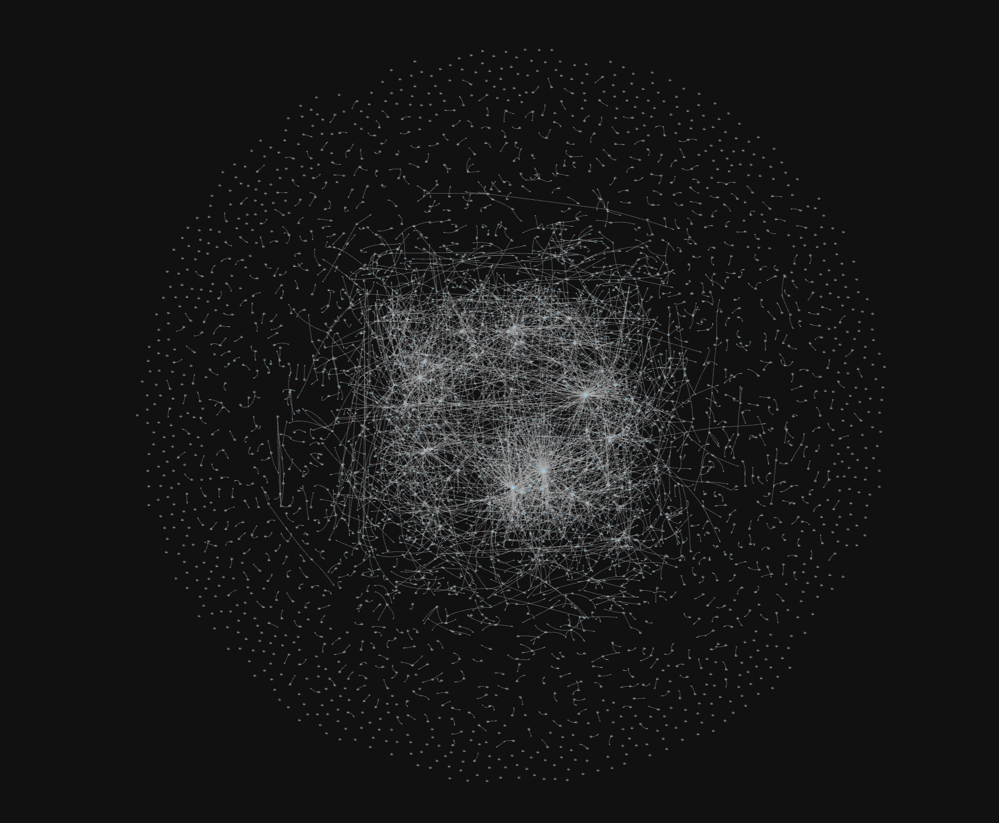

### Here is a tool that can be used to view the complete network of any number of individuals by user name

In [80]:
# ======================================================
# MULTI-LAYER ATTENTION NETWORK (G3 — PYVIS, BOUNDED)
# ======================================================

import networkx as nx
from pyvis.network import Network
from IPython.display import HTML
from collections import Counter

# ======================================================
# INPUT: FOCUS USERS
# ======================================================

FOCUS_USERS = [
    "BarackObama",
    "JoeBiden",
    "SenKamalaHarris",
    "GovRonDeSantis",
    "DrEricDing",
    "JustinTrudeau",
    "realDonaldTrump"
]

# ======================================================
# EXPANSION TUNABLES
# ======================================================

SUBUSER_EXPANSION_MODE = "all"
# options:
#   "all"   → include full ego of each sub-user
#   "top_n" → include only top neighbors by interaction count

MAX_SUBUSER_NEIGHBORS = 20     # used only if mode == "top_n"

MIN_EDGE_COUNT = 1             # keep all real interactions

# ======================================================
# PHYSICS TUNABLES (CPU SAFE)
# ======================================================

ENABLE_PHYSICS = True
PHYSICS_RUNTIME_MS = 35000      # <-- HARD STOP (35 seconds)
OUTPUT_HTML = "multi_layer_attention_network.html"

# ======================================================
# BUILD AUTHORITATIVE EVENT GRAPH
# ======================================================

G3 = nx.MultiDiGraph()
G3.add_edges_from(parsed[["Source", "Target"]].itertuples(index=False))

focus_set = {u for u in FOCUS_USERS if u in G3}
if not focus_set:
    raise ValueError("None of the focus users exist in the graph.")

# ======================================================
# LAYER 1 — USERS WHO POINT TO FOCUS USERS
# ======================================================

layer1_users = set()

for u, v in G3.edges():
    if v in focus_set:
        layer1_users.add(u)

layer1_users -= focus_set  # remove self-loops on elites

# ======================================================
# LAYER 2 — EXPAND SUB-USER NETWORKS
# ======================================================

ego_nodes = set(focus_set) | layer1_users
ego_edges = Counter()

# Include all edges touching focus or layer1
for u, v in G3.edges():
    if u in ego_nodes or v in ego_nodes:
        ego_edges[(u, v)] += 1
        ego_nodes.add(u)
        ego_nodes.add(v)

# Expand sub-user neighborhoods
for sub_user in layer1_users:
    neighbor_counts = Counter()

    for _, v, _ in G3.out_edges(sub_user, keys=True):
        neighbor_counts[v] += 1
    for u, _, _ in G3.in_edges(sub_user, keys=True):
        neighbor_counts[u] += 1

    if SUBUSER_EXPANSION_MODE == "top_n":
        neighbors = {n for n, _ in neighbor_counts.most_common(MAX_SUBUSER_NEIGHBORS)}
    else:
        neighbors = set(neighbor_counts)

    # Add edges between sub_user and selected neighbors (both directions if present)
    for u, v in G3.edges():
        if u == sub_user and v in neighbors:
            ego_edges[(u, v)] += 1
            ego_nodes.add(v)
        if v == sub_user and u in neighbors:
            ego_edges[(u, v)] += 1
            ego_nodes.add(u)

print(
    f"Final network: {len(ego_nodes)} nodes, "
    f"{len(ego_edges)} edges"
)

# ======================================================
# BUILD PYVIS NETWORK
# ======================================================

net = Network(
    height="900px",
    width="100%",
    bgcolor="#111111",
    font_color="white",
    directed=True,
    notebook=True,
    cdn_resources="in_line"
)

# Use bounded stabilization (JSON) instead of indefinite physics
if ENABLE_PHYSICS:
    net.set_options("""
{
  "physics": {
    "enabled": true,
    "stabilization": {
      "enabled": true,
      "iterations": 150,
      "updateInterval": 25,
      "fit": true
    },
    "barnesHut": {
      "gravitationalConstant": -7000,
      "centralGravity": 0.3,
      "springLength": 150,
      "springConstant": 0.035,
      "damping": 0.09
    }
  }
}
""")
else:
    net.toggle_physics(False)

# ======================================================
# ADD NODES (LAYER-AWARE STYLING)
# ======================================================

for node in ego_nodes:
    if node in focus_set:
        color = "tomato"
        size = 42
        title = f"<b>{node}</b><br>FOCUS USER"
    elif node in layer1_users:
        color = "#f5b041"   # amber
        size = 24
        title = f"{node}<br>Direct audience member"
    else:
        color = "skyblue"
        size = 14
        title = node

    net.add_node(
        node,
        label=node,
        size=size,
        color=color,
        title=title
    )

# ======================================================
# ADD EDGES (WIDTH ∝ EVENT COUNT)
# ======================================================

for (u, v), count in ego_edges.items():
    if count >= MIN_EDGE_COUNT:
        net.add_edge(
            u,
            v,
            value=count,
            width=min(10, 1.2 + count * 0.5),
            color="#aaaaaa",
            title=f"events = {count}"
        )

# ======================================================
# RENDER + HARD STOP PHYSICS
# ======================================================

net.save_graph(OUTPUT_HTML)

html = open(OUTPUT_HTML).read()

# Hard stop physics after PHYSICS_RUNTIME_MS milliseconds
html += f"""
<script>
setTimeout(function() {{
  if (typeof network !== "undefined") {{
    network.stopSimulation();
    network.setOptions({{ physics: false }});
    console.log("Physics stopped (G3).");
  }}
}}, {PHYSICS_RUNTIME_MS});
</script>
"""

HTML(html)

Final network: 484 nodes, 566 edges


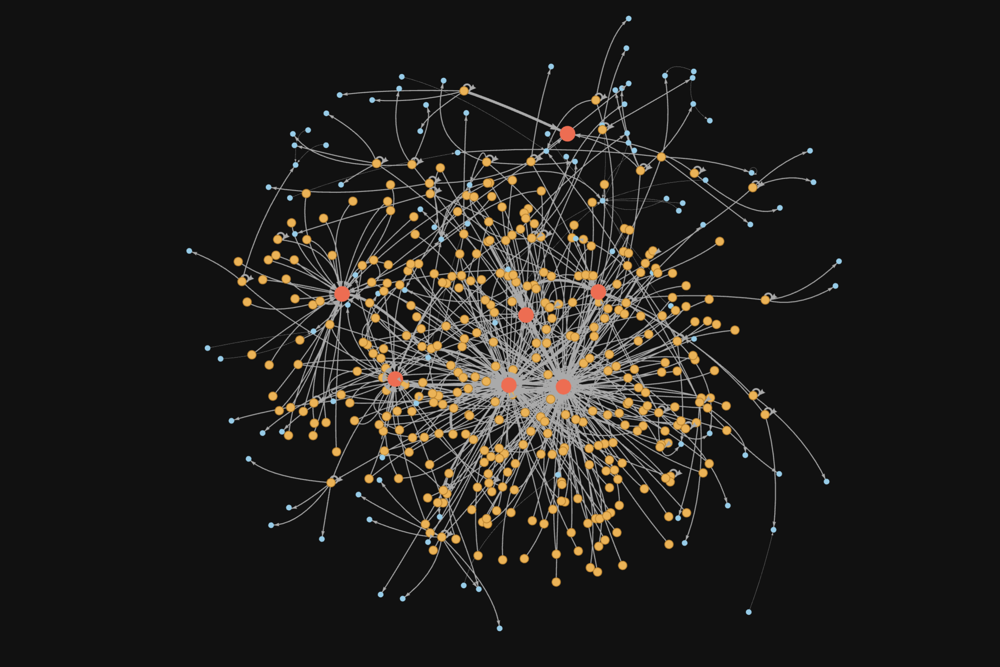

**Analysis and Key Findings:**
The most interesting finding, perhaps, is that the "elites" by various centrality measures do not necessarily connect to each other very often.  In other words, there are very few instances of linkages in the data between "elite" accounts.  


**Recommendations:**
We think a larger data set may reveal more connections, or one time-stamped to certain periods of time could be revealing.  For example, maybe there is an up-tick in inter-elite interactions during election cycles, for example.  In the dataset provided, however, there are no linkages between Joe Biden and Kamala Harris or between Obama and Joe Biden.  

### (C) Top 20 Influencers

We used the logistic-regression model from Part I to construct a single influence score for each user in our Part II Twitter network, and then ranked users to identify the top 20 influencers. The approach keeps the Part I “what matters” signal (coefficients) while adapting it to the features we can reliably compute from the tweets + network we built.

**Objective:** Identify the Top 20 influencers in the Part II tweet dataset by scoring each user using the Part I logistic regression coefficients (influence predictors), applied to overlapping profile + network metrics available in Part II.


**Methodology:**

1. **Feature alignment (Part I → Part II):** We mapped only overlapping predictors that exist in our Part II data:

   * `diff_follower_count` → `followers`
   * `diff_following_count` → `friends` (Twitter “following”)
   * `diff_listed_count` → `listed`
   * `diff_degree` → **`in_degree` only** (we explicitly used **in-degree** as the degree proxy because it represents *attention received*; we **did not use out-degree**)
   * `diff_betweenness` → `betweenness`
   * `diff_closeness` → `closeness`

2. **Handling missing profile values:** Many nodes appear only as “mentioned/retweeted targets” and do not have profile stats in the tweet-author metadata. To keep the full network ranked, we **imputed missing `followers/friends/listed` using the median** of observed values.

3. **Normalization:**

   * Applied `log1p()` to heavy-tailed count variables: `followers`, `friends`, `listed`, `in_degree`
   * Then min–max scaled all used features to **[0, 1]** within Part II before scoring.

4. **Influence scoring (logit-consistent):**
   We computed a **log-scale influence score** as a weighted sum using the **signed Part I coefficients**:

   $$
    \text{influencer\_score (log scale)}=\sum_{f}\beta_f \cdot f_{\text{norm}}
    $$


   
   (Signed betas were kept so negative drivers like `friends` penalize the score when large.)

6. **Ranking + Top 20 output:**
   We ranked users by `influencer_score (log scale)` (equivalently by its monotonic transform `exp(score)`), and selected the **top 20** as the final influencer list.


In [81]:
# 1) Build a clean join key to capture all the available metrics for Part II evaluation

tweets = df2.copy()
tweets["handle"] = tweets["screen_name"].astype(str).str.strip().str.lstrip("@")
tweets["handle_key"] = tweets["handle"].str.lower()

cent = centrality_df.copy()
cent["handle"] = cent["node"].astype(str).str.strip().str.lstrip("@")
cent["handle_key"] = cent["handle"].str.lower()

# 2) Aggregate tweet-level profile stats to user-level
# Using max() for profile snapshot fields (followers/friends/listed)
profile_df = (
    tweets.groupby("handle_key", as_index=False)
    .agg(
        screen_name=("handle", "first"),
        followers=("followers", "max"),
        friends=("friends", "max"),
        listed=(" listed", "max"),
    )
)

# 3) Keep only the network metrics
cent_small = cent[["handle_key", "node", "in_degree", "betweenness", "closeness"]].copy()

# 4) Merge: keep all network nodes; profile fields will be NaN if missing
user_table = cent_small.merge(profile_df, on="handle_key", how="left")

# Choose a single display name column
user_table["user"] = user_table["node"].fillna(user_table["screen_name"])

# Final table
user_table = user_table[
    ["user", "followers", "friends", "listed", "in_degree", "betweenness", "closeness"]
].sort_values("in_degree", ascending=False)

display(user_table.head(10))

,user,followers,friends,listed,in_degree,betweenness,closeness
0,BarackObama,NaN,NaN,NaN,165,0.0,0.027887
1,DrEricDing,NaN,NaN,NaN,133,0.0,0.021900
2,Oobahs,NaN,NaN,NaN,120,0.0,0.018477
3,Boringstein,NaN,NaN,NaN,64,0.0,0.010265
4,Cleavon_MD,NaN,NaN,NaN,52,0.0,0.008212
5,SenKamalaHarris,NaN,NaN,NaN,44,0.0,0.007186
6,kylegriffin1,NaN,NaN,NaN,41,0.0,0.006501
7,BBhuttoZardari,NaN,NaN,NaN,35,0.0,0.005646
8,btsarmy2018x,NaN,NaN,NaN,33,0.0,0.005475
9,GovRonDeSantis,NaN,NaN,NaN,33,0.0,0.005646


In [82]:
# ============================================================
# Logit-style scoring + Influence Odds Index (Part II)
# ============================================================
# Goal:
#   Use Part I logistic regression coefficients (signed betas)
#   as weights to compute an influence score for each user in Part II.
#
# Output:
#   - log_odds_score: linear score (sum of beta * normalized feature)
#   - influence_odds_index: exp(log_odds_score), an odds-scale ranking index
#   - rank_logit: rank based on log_odds_score (same ordering as exp(.))
# ============================================================

# Map feature names from Part I ("diff_*") -> Part II column names (user_table)
FEATURE_MAP = {
    "diff_listed_count": "listed",
    "diff_follower_count": "followers",
    "diff_following_count": "friends",     # following_count ~ friends in tweets metadata
    "diff_degree": "in_degree",            # use in_degree as degree proxy (attention received)
    "diff_betweenness": "betweenness",
    "diff_closeness": "closeness",
}

def build_weights_from_importance(importance: pd.DataFrame) -> dict:
    """
    Extract signed coefficients from Part I and map them to Part II feature names.
    We keep *signed* betas because negative betas should penalize the score.
    """
    imp = importance.copy()

    # Create mapped Part II feature column (e.g., diff_listed_count -> listed)
    imp["mapped"] = imp["Feature"].map(FEATURE_MAP)

    # Keep only rows that exist in Part II (overlapping variables)
    imp = imp.dropna(subset=["mapped"]).copy()

    # Signed coefficients from Part I logistic regression
    beta_signed = dict(zip(imp["mapped"], imp["Weight"]))
    return beta_signed

def minmax_01(s: pd.Series) -> pd.Series:
    """
    Min-max scale a series to [0,1]. If constant/empty, return zeros.
    """
    s = pd.to_numeric(s, errors="coerce").astype(float)
    mn, mx = s.min(), s.max()
    if pd.isna(mn) or pd.isna(mx) or mx == mn:
        return pd.Series(0.0, index=s.index)
    return (s - mn) / (mx - mn)

def sigmoid(z: pd.Series) -> pd.Series:
    """
    Sigmoid mapping of a score into (0,1). Useful for intuition,
    but NOT a calibrated probability in Part II.
    """
    z = pd.to_numeric(z, errors="coerce").astype(float)
    return 1.0 / (1.0 + np.exp(-z))

# ----------------------------
# 1) Load signed coefficients from Part I
# ----------------------------
beta_signed = build_weights_from_importance(importance)
FEATURES = list(beta_signed.keys())  # Part II features used in scoring

# ----------------------------
# 2) Prepare Part II data and impute missing profile values
# ----------------------------
scoring = user_table.copy()

# Profile fields exist only for users who appear as tweet authors in df.
# Nodes that appear only as "mentioned/retweeted" often have NaNs for these fields.
prof_cols = [c for c in ["followers", "friends", "listed"] if c in scoring.columns]

# Track whether any profile metrics were missing (useful for reporting/caveats)
scoring["profile_missing_any"] = scoring[prof_cols].isna().any(axis=1).astype(int)

# Median-impute missing profile fields so we keep all nodes in the ranking
for c in prof_cols:
    scoring[c] = pd.to_numeric(scoring[c], errors="coerce")
    scoring[c] = scoring[c].fillna(scoring[c].median())

# Ensure network metrics are numeric and impute if any missing
for c in ["in_degree", "betweenness", "closeness"]:
    if c in scoring.columns:
        scoring[c] = pd.to_numeric(scoring[c], errors="coerce")
        scoring[c] = scoring[c].fillna(scoring[c].median())

# ----------------------------
# 3) Normalize Part II features (as required by assignment)
# ----------------------------
# Many count variables are heavy-tailed (followers, friends, listed, in_degree),
# so we apply log1p BEFORE min-max normalization to reduce outlier dominance.
LOG1P_FEATURES = {"followers", "friends", "listed", "in_degree"}

for f in FEATURES:
    # Ensure the expected feature exists in the user_table
    if f not in scoring.columns:
        raise KeyError(
            f"Missing feature '{f}' in user_table. Columns: {list(scoring.columns)}"
        )

    # Convert to numeric
    x = pd.to_numeric(scoring[f], errors="coerce").astype(float)

    # Log transform for heavy-tailed, non-negative count-like features
    if f in LOG1P_FEATURES:
        x = np.log1p(x.clip(lower=0))

    # Min-max normalize to [0,1]
    scoring[f"{f}_norm"] = minmax_01(x)

# ----------------------------
# 4) Compute influence score using signed betas (log-odds scale)
# ----------------------------
# Contribution from each feature: beta * normalized_feature
for f, b in beta_signed.items():
    scoring[f"logodds_contrib_{f}"] = b * scoring[f"{f}_norm"]

# Total score = sum of contributions across available Part II features
logodds_cols = [f"logodds_contrib_{f}" for f in FEATURES]
scoring["influencer_score (log scale)"] = scoring[logodds_cols].sum(axis=1)

# Odds-scale ranking index (monotonic transform of log-scale score)
# NOTE: ranking index (relative odds scale), not a calibrated probability.
scoring["influencer_score (relative odds)"] = np.exp(scoring["influencer_score (log scale)"])

# Rank users by influencer_score (log scale)
scoring["rank_logit"] = scoring["influencer_score (log scale)"].rank(
    method="first", ascending=False
).astype(int)

# Show top 20
top20_logit = scoring.sort_values("influencer_score (log scale)", ascending=False).head(20)[
    ["rank_logit", "user",
     "influencer_score (log scale)",
     "influencer_score (relative odds)",
     "profile_missing_any"]
]

display(top20_logit)


print("Total nodes scored:", len(scoring))
print("Nodes with any profile field imputed:", int(scoring["profile_missing_any"].sum()))


,rank_logit,user,influencer_score (log scale),influencer_score (relative odds),profile_missing_any
5300,1,StephenKing,4.610362,100.520530,0
255,2,NEJM,4.574038,96.934729,0
2822,3,NME,4.427104,83.688724,0
966,4,axios,4.318317,75.062155,0
2149,5,KIRO7Seattle,3.910067,49.902292,0
80,6,ragipsoylu,3.883039,48.571600,0
2645,7,MBTA,3.854764,47.217456,0
3212,8,TheDoctors,3.851158,47.047514,0
408,9,FOX13News,3.805507,44.948031,0
2364,10,edmontonjournal,3.748920,42.475177,0


Total nodes scored: 5846
Nodes with any profile field imputed: 2140


We then generate a **driver contribution table** for the **Top 20 influencers**, so we can see *what is driving each user’s influence score*. We first take the top 20 users ranked by `influencer_score (log scale)`. For those users, we pull the per-feature contribution terms that were already created during scoring (`logodds_contrib_<feature> = β × feature_norm`). We then convert these contributions into **percentage shares** by dividing each feature’s absolute contribution by the sum of absolute contributions across the Part II features used in the model, ensuring the shares sum to ~100% per user. Using absolute values is intentional: even when a coefficient is negative (i.e., the feature penalizes influence), it still counts as an important “driver” of the final score magnitude.


In [83]:
# ============================================================
# % Contribution Table (Top-20) for Part-II Features Only
# ============================================================
# Goal:
#   For the Top 20 influencers, show how much each Part-II feature
#   contributes to the overall score (on the log-scale score),
#   expressed as a % share that sums to ~100% per user.
#
# Notes:
#   - We use ABS(contribution) in the denominator so that negative
#     coefficients (penalties) still count as "influential drivers"
#     of the final score magnitude.
#   - % contributions are computed ONLY across the Part-II features
#     included in FEATURES (followers, listed, etc.), not Part-I-only
#     features that are missing in the tweets data.
# ============================================================

import numpy as np

# ----------------------------
# 1) Select Top 20 by influencer score (log scale)
# ----------------------------
top20 = (
    scoring.sort_values("influencer_score (log scale)", ascending=False)
    .head(20)
    .copy()
)

# ----------------------------
# 2) Identify signed per-feature contribution columns
#    These were created in Cell 1 as:
#      logodds_contrib_<feature> = beta(feature) * feature_norm
# ----------------------------
contrib_cols = [f"logodds_contrib_{f}" for f in FEATURES]

# ----------------------------
# 3) Compute denominator for % shares:
#    Sum of ABS(contrib) across Part-II features for each user
# ----------------------------
denom = top20[contrib_cols].abs().sum(axis=1).replace(0, np.nan)

# ----------------------------
# 4) Compute % contribution per feature
#    pct_f = |contrib_f| / sum_j |contrib_j| * 100
# ----------------------------
for f in FEATURES:
    top20[f"pct_{f}"] = (top20[f"logodds_contrib_{f}"].abs() / denom) * 100

# ----------------------------
# 5) Build final display table
# ----------------------------
pct_cols = [f"pct_{f}" for f in FEATURES]

pct_table = top20[
    ["rank_logit", "user",
     "influencer_score (log scale)",
     "influencer_score (relative odds)"] + pct_cols
].copy()

# ----------------------------
# 6) Formatting for readability
# ----------------------------
pct_table["influencer_score (log scale)"] = pct_table["influencer_score (log scale)"].round(3)
pct_table["influencer_score (relative odds)"] = pct_table["influencer_score (relative odds)"].round(2)

for c in pct_cols:
    pct_table[c] = pct_table[c].round(1)

display(pct_table)


,rank_logit,user,influencer_score (log scale),influencer_score (relative odds),pct_listed,pct_followers,pct_in_degree,pct_betweenness,pct_friends,pct_closeness
5300,1,StephenKing,4.610,100.52,54.4,41.9,0.0,0.0,3.7,0.0
255,2,NEJM,4.574,96.93,51.4,36.0,8.1,0.0,4.5,0.0
2822,3,NME,4.427,83.69,53.6,36.3,4.0,0.0,6.1,0.0
966,4,axios,4.318,75.06,51.7,36.3,6.7,0.0,5.4,0.0
2149,5,KIRO7Seattle,3.910,49.90,50.4,37.6,4.4,0.0,7.6,0.0
80,6,ragipsoylu,3.883,48.57,45.4,35.1,12.7,0.0,6.7,0.0
2645,7,MBTA,3.855,47.22,50.6,40.0,4.8,0.0,4.6,0.0
3212,8,TheDoctors,3.851,47.05,50.4,39.6,4.7,0.0,5.3,0.0
408,9,FOX13News,3.806,44.95,47.5,38.0,7.2,0.0,7.3,0.0
2364,10,edmontonjournal,3.749,42.48,51.4,38.7,4.9,0.0,5.0,0.0


### Visualization of the top 20 by influencer score

In [84]:
# ======================================================
# FULL NETWORK + HIGHLIGHT TOP-20 INFLUENCERS
# ======================================================
# Depends on:
#   - parsed  : event-level edge list with columns ["Source","Target"]
#   - scoring : output DataFrame from your Part II scoring cell
# ======================================================

import networkx as nx
from pyvis.network import Network
from IPython.display import HTML
from pathlib import Path
from collections import Counter

# ----------------------------
# TUNABLES
# ----------------------------
TOP_K = 20
GRAPH_NAME = "FULL_HIGHLIGHT"
OUTPUT_HTML = f"{GRAPH_NAME}.html"

# Column names in the parsed edge list
SRC_COL = "Source"
TGT_COL = "Target"

# Visual tuning
ENABLE_PHYSICS = True
PHYSICS_RUNTIME_MS = 35000

LABEL_NON_TOP = False        # keep False to reduce clutter
SHOW_SELF_LOOPS = True       # set False if loops blur the plot
MIN_EDGE_COUNT = 1           # keep all edges by default

# Node sizes
SIZE_TOP = 42
SIZE_OTHER = 10

# Colors
COLOR_TOP = "tomato"
COLOR_OTHER = "#7FB3D5"      # muted sky-blue

# ----------------------------
# 1) Identify Top-K influencers from scoring
# ----------------------------
SCORE_COL = "influencer_score (log scale)"
if SCORE_COL not in scoring.columns:
    raise KeyError(f"'{SCORE_COL}' not found in scoring columns: {list(scoring.columns)}")

focus_users = (
    scoring.sort_values(SCORE_COL, ascending=False)
    .head(TOP_K)["user"]
    .astype(str)
    .tolist()
)
focus_set = set(focus_users)

print(f"Highlighting Top-{TOP_K} influencers by: {SCORE_COL}")
print(focus_users)

# ----------------------------
# 2) Build full event graph from parsed
# ----------------------------
if SRC_COL not in parsed.columns or TGT_COL not in parsed.columns:
    raise KeyError(
        f"parsed must have columns '{SRC_COL}' and '{TGT_COL}'. "
        f"Available columns: {list(parsed.columns)}"
    )

# Count repeated interactions so we can scale edge width
edge_counts = Counter()
for u, v in parsed[[SRC_COL, TGT_COL]].itertuples(index=False, name=None):
    edge_counts[(str(u), str(v))] += 1

G = nx.DiGraph()
for (u, v), cnt in edge_counts.items():
    if (not SHOW_SELF_LOOPS) and (u == v):
        continue
    if cnt < MIN_EDGE_COUNT:
        continue
    G.add_edge(u, v, weight=cnt)

print(f"Full graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")
print(f"Top-K present in graph: {sum(u in G for u in focus_set)} / {TOP_K}")

# ----------------------------
# 3) Build PyVis network
# ----------------------------
net = Network(
    height="900px",
    width="100%",
    bgcolor="#111111",
    font_color="white",
    directed=True,
    notebook=True,
    cdn_resources="in_line",
)

if ENABLE_PHYSICS:
    net.set_options("""
{
  "physics": {
    "enabled": true,
    "stabilization": {
      "enabled": true,
      "iterations": 150,
      "updateInterval": 25,
      "fit": true
    },
    "barnesHut": {
      "gravitationalConstant": -6000,
      "centralGravity": 0.25,
      "springLength": 120,
      "springConstant": 0.04,
      "damping": 0.10
    }
  }
}
""")
else:
    net.toggle_physics(False)

# ----------------------------
# 4) Add nodes (full network; highlight top-K)
# ----------------------------
# Quick lookup for hover tooltips
score_lookup = (
    scoring.set_index("user")[[
        "influencer_score (log scale)",
        "influencer_score (relative odds)",
        "profile_missing_any"
    ]]
    if "user" in scoring.columns else None
)

for node in G.nodes():
    node_str = str(node)
    is_top = node_str in focus_set

    # Labeling: only label top nodes by default
    label = node_str if (is_top or LABEL_NON_TOP) else ""

    # Styling
    color = COLOR_TOP if is_top else COLOR_OTHER
    size = SIZE_TOP if is_top else SIZE_OTHER

    # Tooltip (hover)
    if score_lookup is not None and node_str in score_lookup.index:
        row = score_lookup.loc[node_str]
        title = (
            f"<b>{node_str}</b><br>"
            f"log-score: {row['influencer_score (log scale)']:.3f}<br>"
            f"relative-odds: {row['influencer_score (relative odds)']:.2f}<br>"
            f"profile_imputed_any: {int(row['profile_missing_any'])}"
        )
    else:
        title = f"<b>{node_str}</b>"

    net.add_node(node_str, label=label, size=size, color=color, title=title)

# ----------------------------
# 5) Add edges (full network; width ∝ count)
# ----------------------------
for u, v, data in G.edges(data=True):
    cnt = int(data.get("weight", 1))
    net.add_edge(
        str(u), str(v),
        value=cnt,
        width=min(10, 1.0 + 0.4 * cnt),
        color="#aaaaaa",
        title=f"events = {cnt}"
    )

# ----------------------------
# 6) Save + stop physics after render
# ----------------------------
net.save_graph(OUTPUT_HTML)

html_path = Path(OUTPUT_HTML)
html = html_path.read_text()

STOP_PHYSICS_JS = f"""
<script>
setTimeout(function() {{
  if (typeof network !== "undefined") {{
    network.stopSimulation();
    network.setOptions({{ physics: false }});
    console.log("Physics stopped.");
  }}
}}, {PHYSICS_RUNTIME_MS});
</script>
"""

html = html.replace("</body>", STOP_PHYSICS_JS + "\n</body>")
html_path.write_text(html)

HTML(html)


Highlighting Top-20 influencers by: influencer_score (log scale)
['StephenKing', 'NEJM', 'NME', 'axios', 'KIRO7Seattle', 'ragipsoylu', 'MBTA', 'TheDoctors', 'FOX13News', 'edmontonjournal', 'bmine3rz', 'WLOS_13', 'DanaONeilWriter', 'capetownmag', 'naomirwolf', 'FCN2go', 'WFMY', 'greateranglia', 'UWAthletics', 'Indomaret']
Full graph: 5846 nodes, 6277 edges
Top-K present in graph: 20 / 20


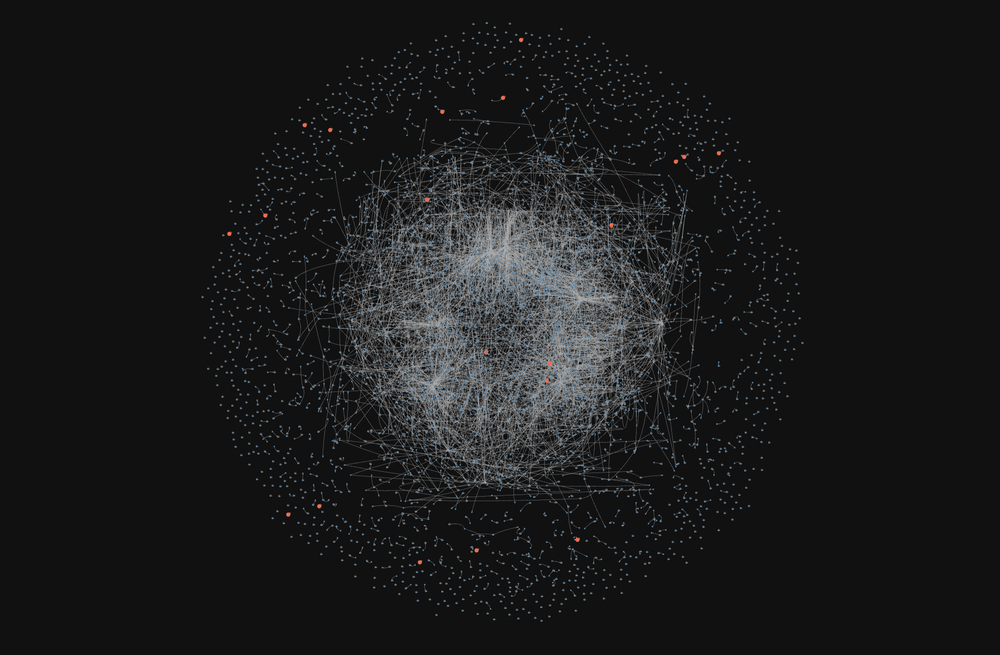

**Analysis & Key Findings:**

* **Influence is being driven primarily by “platform authority”**: the Top-20 scores are dominated by **% listed + % followers (typically ~80–95% combined)**, meaning the Part I weights are rewarding accounts that are broadly recognized (high followers, high listed) more than accounts that are structurally central in *this* tweet network.
* **Network centrality is not differentiating the Top-20 here**: **betweenness/closeness are ~0** for most Top-20, so “broker/bridge” behavior is not contributing to the score in this dataset (likely due to sparse/fragmented interaction paths).
* **Graph placement aligns with this**: many highlighted influencers sit **outside the dense core**, which is consistent with “high external prestige” accounts that are **mentioned/retweeted occasionally** but are **not embedded in the core conversation flow** of the collected tweets.

#### **More Refined Approach for Top 20 Influencers given this dataset:**

This Part II scoring step intentionally carries forward the Part I logistic weights, so the resulting Top-20 list should be interpreted as a **Part I–style “influence likelihood” ranking** rather than a pure “core-network centrality” ranking. In our output, the **largest shares of the score come from listed and followers**, which are platform-level signals of broad authority/visibility. As a result, several top-ranked accounts appear **outside the dense core of the interaction graph**; they can be highly influential in terms of reach and public recognition, but they may not be the most structurally central actors within this specific tweet-to-tweet conversation network. To separate these two notions of influence, the next step constructs an **alternative Top-20 list using only network-centric metrics** (e.g., in-degree as the degree proxy, betweenness, closeness), which better captures who is positioned to drive diffusion *within the observed network structure* of our collected tweets.


In [85]:
# ============================================================
# NETWORK-ONLY Logit-style scoring (Part II)
#   Uses ONLY: in_degree, betweenness, closeness
# ============================================================

# Map ONLY network features from Part I -> Part II user_table columns
FEATURE_MAP_NET = {
    "diff_degree": "in_degree",
    "diff_betweenness": "betweenness",
    "diff_closeness": "closeness",
}

def build_weights_from_importance_network_only(importance: pd.DataFrame) -> dict:
    """
    Extract signed coefficients from Part I for ONLY network metrics,
    mapped to Part II column names.
    """
    imp = importance.copy()
    imp["mapped"] = imp["Feature"].map(FEATURE_MAP_NET)
    imp = imp.dropna(subset=["mapped"]).copy()

    # Signed coefficients (keep sign; negatives should penalize)
    beta_signed = dict(zip(imp["mapped"], imp["Weight"]))
    return beta_signed

def minmax_01(s: pd.Series) -> pd.Series:
    """Min-max normalize a series to [0,1]. If constant/empty, return zeros."""
    s = pd.to_numeric(s, errors="coerce").astype(float)
    mn, mx = s.min(), s.max()
    if pd.isna(mn) or pd.isna(mx) or mx == mn:
        return pd.Series(0.0, index=s.index)
    return (s - mn) / (mx - mn)

# ----------------------------
# 1) Load signed network-only coefficients from Part I
# ----------------------------
beta_net = build_weights_from_importance_network_only(importance)
FEATURES_NET = list(beta_net.keys())  # should be: ["in_degree", "betweenness", "closeness"]

print("Network-only features used:", FEATURES_NET)
print("Network-only betas:", beta_net)

# ----------------------------
# 2) Prepare Part II data (network only)
# ----------------------------
scoring_net = user_table.copy()

# Ensure network columns exist + numeric
for c in FEATURES_NET:
    if c not in scoring_net.columns:
        raise KeyError(f"Missing network feature '{c}' in user_table. Columns: {list(scoring_net.columns)}")
    scoring_net[c] = pd.to_numeric(scoring_net[c], errors="coerce").astype(float)

# Impute missing network metrics (rare, but safe)
for c in FEATURES_NET:
    scoring_net[c] = scoring_net[c].fillna(scoring_net[c].median())

# ----------------------------
# 3) Normalize network features
# ----------------------------
# in_degree is typically heavy-tailed -> log1p + minmax
# betweenness/closeness -> minmax directly (already small-scale)
for f in FEATURES_NET:
    x = scoring_net[f].copy()

    if f == "in_degree":
        x = np.log1p(x.clip(lower=0))

    scoring_net[f"{f}_norm"] = minmax_01(x)

# ----------------------------
# 4) Compute network-only influencer scores
# ----------------------------
# Contribution per feature (log-odds style linear score)
for f, b in beta_net.items():
    scoring_net[f"logodds_contrib_{f}"] = b * scoring_net[f"{f}_norm"]

contrib_cols = [f"logodds_contrib_{f}" for f in FEATURES_NET]

# Main score on log scale
scoring_net["influencer_score_net (log scale)"] = scoring_net[contrib_cols].sum(axis=1)

# Relative odds index (monotonic transform; good for ranking)
scoring_net["influencer_score_net (relative odds)"] = np.exp(
    scoring_net["influencer_score_net (log scale)"]
)

# Rank
scoring_net["rank_net"] = scoring_net["influencer_score_net (log scale)"].rank(
    method="first", ascending=False
).astype(int)

# ----------------------------
# 5) Show Top 20 (network-only)
# ----------------------------
top20_net = scoring_net.sort_values(
    "influencer_score_net (log scale)", ascending=False
).head(20)[
    [
        "rank_net", "user",
        "influencer_score_net (log scale)",
        "influencer_score_net (relative odds)",
        "in_degree_norm", "betweenness_norm", "closeness_norm",
    ]
]

display(top20_net)

print("Total nodes scored (network-only):", len(scoring_net))


Network-only features used: ['in_degree', 'betweenness', 'closeness']
Network-only betas: {'in_degree': 1.4979617656637039, 'betweenness': 0.839789043496895, 'closeness': 0.06154840961404316}


,rank_net,user,influencer_score_net (log scale),influencer_score_net (relative odds),in_degree_norm,betweenness_norm,closeness_norm
0,1,BarackObama,1.559510,4.756491,1.000000,0.0,1.000000
1,2,DrEricDing,1.483546,4.408549,0.958109,0.0,0.785323
2,3,Oobahs,1.446087,4.246467,0.938146,0.0,0.662577
263,4,Mask_official_,1.246391,3.477770,0.271185,1.0,0.006135
3,5,Boringstein,1.245873,3.475969,0.816588,0.0,0.368098
4,6,Cleavon_MD,1.181536,3.259377,0.776663,0.0,0.294479
859,7,__Nonhle,1.162092,3.196614,0.214909,1.0,0.006135
5,8,SenKamalaHarris,1.131322,3.099753,0.744654,0.0,0.257669
6,9,kylegriffin1,1.109595,3.033130,0.731158,0.0,0.233129
7,10,BBhuttoZardari,1.062536,2.893701,0.701003,0.0,0.202454


Total nodes scored (network-only): 5846


In [86]:
# ============================================================
# % Contribution Table (Top-20) — NETWORK-ONLY FEATURES
# ============================================================
# Goal:
#   For the Top 20 (network-only) influencers, show how much each
#   network metric contributes to the overall score (log scale),
#   expressed as a % share that sums to ~100% per user.
#
# Notes:
#   - Contribution columns are signed:
#       logodds_contrib_<feature> = beta(feature) * feature_norm
#   - We use ABS(contribution) in the denominator so negative betas
#     still show up as "large drivers" (penalties) of the score.
# ============================================================

# ----------------------------
# 1) Select Top 20 by NETWORK-only influencer score (log scale)
# ----------------------------
top20 = (
    scoring_net.sort_values("influencer_score_net (log scale)", ascending=False)
    .head(20)
    .copy()
)

# ----------------------------
# 2) Identify per-feature contribution columns (network-only)
# ----------------------------
contrib_cols = [f"logodds_contrib_{f}" for f in FEATURES_NET]

# ----------------------------
# 3) Denominator for % shares:
#    sum of ABS(contrib) across network-only features
# ----------------------------
denom = top20[contrib_cols].abs().sum(axis=1).replace(0, np.nan)

# ----------------------------
# 4) Compute % contribution per network feature
# ----------------------------
for f in FEATURES_NET:
    top20[f"pct_{f}"] = (top20[f"logodds_contrib_{f}"].abs() / denom) * 100

# ----------------------------
# 5) Final display table
# ----------------------------
pct_cols = [f"pct_{f}" for f in FEATURES_NET]

pct_table = top20[
    [
        "rank_net", "user",
        "influencer_score_net (log scale)",
        "influencer_score_net (relative odds)",
    ] + pct_cols
].copy()

# ----------------------------
# 6) Formatting
# ----------------------------
pct_table["influencer_score_net (log scale)"] = pct_table[
    "influencer_score_net (log scale)"
].round(3)

pct_table["influencer_score_net (relative odds)"] = pct_table[
    "influencer_score_net (relative odds)"
].round(2)

for c in pct_cols:
    pct_table[c] = pct_table[c].round(1)

display(pct_table)


,rank_net,user,influencer_score_net (log scale),influencer_score_net (relative odds),pct_in_degree,pct_betweenness,pct_closeness
0,1,BarackObama,1.560,4.76,96.1,0.0,3.9
1,2,DrEricDing,1.484,4.41,96.7,0.0,3.3
2,3,Oobahs,1.446,4.25,97.2,0.0,2.8
263,4,Mask_official_,1.246,3.48,32.6,67.4,0.0
3,5,Boringstein,1.246,3.48,98.2,0.0,1.8
4,6,Cleavon_MD,1.182,3.26,98.5,0.0,1.5
859,7,__Nonhle,1.162,3.20,27.7,72.3,0.0
5,8,SenKamalaHarris,1.131,3.10,98.6,0.0,1.4
6,9,kylegriffin1,1.110,3.03,98.7,0.0,1.3
7,10,BBhuttoZardari,1.063,2.89,98.8,0.0,1.2


In [87]:
# ======================================================
# FULL NETWORK GRAPH + HIGHLIGHT TOP-20 INFLUENCERS (ALL or NET)
# ======================================================
# Depends on:
#   - parsed      : event-level edge list with columns ["Source","Target"]
#   - scoring     : DataFrame from full scoring (profile + network), optional
#   - scoring_net : DataFrame from network-only scoring, optional
# ======================================================

import networkx as nx
from pyvis.network import Network
from IPython.display import HTML
from pathlib import Path
from collections import Counter

# ----------------------------
# TUNABLES
# ----------------------------
TOP_K = 20
GRAPH_NAME = "FULL_HIGHLIGHT"
OUTPUT_HTML = f"{GRAPH_NAME}.html"

# Use which ranking?
#   "all" -> uses scoring with "influencer_score (log scale)"
#   "net" -> uses scoring_net with "influencer_score_net (log scale)"
RANKING_MODE = "net"   # change to "all" if you want the full model score

# Column names in parsed edge list
SRC_COL = "Source"
TGT_COL = "Target"

# Visual tuning
ENABLE_PHYSICS = True
PHYSICS_RUNTIME_MS = 35000

LABEL_NON_TOP = False        # keep False to reduce clutter
SHOW_SELF_LOOPS = True       # if loops blur the plot, set False
MIN_EDGE_COUNT = 1           # keep all edges by default

# Node sizes
SIZE_TOP = 42
SIZE_OTHER = 8

# Colors
COLOR_TOP = "tomato"
COLOR_OTHER = "#7FB3D5"      # muted sky-blue

# ----------------------------
# 1) Choose scoring table + score columns
# ----------------------------
if RANKING_MODE == "all":
    if "scoring" not in globals():
        raise NameError("RANKING_MODE='all' but `scoring` is not defined in the notebook.")
    scoring_used = scoring
    SCORE_COL_LOG = "influencer_score (log scale)"
    SCORE_COL_ODDS = "influencer_score (relative odds)"
    EXTRA_COLS = ["profile_missing_any"] if "profile_missing_any" in scoring_used.columns else []

elif RANKING_MODE == "net":
    if "scoring_net" not in globals():
        raise NameError("RANKING_MODE='net' but `scoring_net` is not defined in the notebook.")
    scoring_used = scoring_net
    SCORE_COL_LOG = "influencer_score_net (log scale)"
    SCORE_COL_ODDS = "influencer_score_net (relative odds)"
    EXTRA_COLS = []  # network-only doesn't use profile imputation flag

else:
    raise ValueError("RANKING_MODE must be 'all' or 'net'")

# Sanity checks
required_cols = {"user", SCORE_COL_LOG, SCORE_COL_ODDS}
missing = [c for c in required_cols if c not in scoring_used.columns]
if missing:
    raise KeyError(f"Missing columns in scoring_used: {missing}. Available: {list(scoring_used.columns)}")

# ----------------------------
# 2) Identify Top-K influencers
# ----------------------------
focus_users = (
    scoring_used.sort_values(SCORE_COL_LOG, ascending=False)
    .head(TOP_K)["user"]
    .astype(str)
    .tolist()
)
focus_set = set(focus_users)

print(f"Highlighting Top-{TOP_K} influencers by: {SCORE_COL_LOG} (mode={RANKING_MODE})")
print(focus_users)

# ----------------------------
# 3) Build full event graph from parsed
# ----------------------------
if SRC_COL not in parsed.columns or TGT_COL not in parsed.columns:
    raise KeyError(
        f"parsed must have columns '{SRC_COL}' and '{TGT_COL}'. "
        f"Available columns: {list(parsed.columns)}"
    )

# Count repeated interactions so edge width can scale
edge_counts = Counter()
for u, v in parsed[[SRC_COL, TGT_COL]].itertuples(index=False, name=None):
    u = str(u)
    v = str(v)
    edge_counts[(u, v)] += 1

G = nx.DiGraph()
for (u, v), cnt in edge_counts.items():
    if (not SHOW_SELF_LOOPS) and (u == v):
        continue
    if cnt < MIN_EDGE_COUNT:
        continue
    G.add_edge(u, v, weight=cnt)

print(f"Full graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")
print(f"Top-K present in graph: {sum(u in G for u in focus_set)} / {TOP_K}")

# ----------------------------
# 4) Build PyVis network
# ----------------------------
net = Network(
    height="900px",
    width="100%",
    bgcolor="#111111",
    font_color="white",
    directed=True,
    notebook=True,
    cdn_resources="in_line",
)

if ENABLE_PHYSICS:
    net.set_options("""
{
  "physics": {
    "enabled": true,
    "stabilization": {
      "enabled": true,
      "iterations": 150,
      "updateInterval": 25,
      "fit": true
    },
    "barnesHut": {
      "gravitationalConstant": -6000,
      "centralGravity": 0.25,
      "springLength": 120,
      "springConstant": 0.04,
      "damping": 0.10
    }
  }
}
""")
else:
    net.toggle_physics(False)

# ----------------------------
# 5) Add nodes (full network; highlight top-K)
# ----------------------------
# Tooltip lookup
tooltip_cols = [SCORE_COL_LOG, SCORE_COL_ODDS] + EXTRA_COLS
score_lookup = scoring_used.set_index("user")[tooltip_cols]

for node in G.nodes():
    node_str = str(node)
    is_top = node_str in focus_set

    # Label: only for top nodes unless you force LABEL_NON_TOP
    label = node_str if (is_top or LABEL_NON_TOP) else ""

    # Visual styling
    color = COLOR_TOP if is_top else COLOR_OTHER
    size = SIZE_TOP if is_top else SIZE_OTHER

    # Tooltip
    if node_str in score_lookup.index:
        row = score_lookup.loc[node_str]
        title = (
            f"<b>{node_str}</b><br>"
            f"log-score: {float(row[SCORE_COL_LOG]):.3f}<br>"
            f"relative-odds: {float(row[SCORE_COL_ODDS]):.2f}"
        )
        if "profile_missing_any" in row.index:
            title += f"<br>profile_imputed_any: {int(row['profile_missing_any'])}"
    else:
        title = f"<b>{node_str}</b><br>(no score row found)"

    net.add_node(node_str, label=label, size=size, color=color, title=title)

# ----------------------------
# 6) Add edges (full network; width ∝ count)
# ----------------------------
for u, v, data in G.edges(data=True):
    cnt = int(data.get("weight", 1))
    net.add_edge(
        str(u), str(v),
        value=cnt,
        width=min(10, 1.0 + 0.4 * cnt),
        color="#aaaaaa",
        title=f"events = {cnt}"
    )

# ----------------------------
# 7) Save + stop physics after render
# ----------------------------
net.save_graph(OUTPUT_HTML)

html_path = Path(OUTPUT_HTML)
html = html_path.read_text()

STOP_PHYSICS_JS = f"""
<script>
setTimeout(function() {{
  if (typeof network !== "undefined") {{
    network.stopSimulation();
    network.setOptions({{ physics: false }});
    console.log("Physics stopped.");
  }}
}}, {PHYSICS_RUNTIME_MS});
</script>
"""

html = html.replace("</body>", STOP_PHYSICS_JS + "\n</body>")
html_path.write_text(html)

HTML(html)


Highlighting Top-20 influencers by: influencer_score_net (log scale) (mode=net)
['BarackObama', 'DrEricDing', 'Oobahs', 'Mask_official_', 'Boringstein', 'Cleavon_MD', '__Nonhle', 'SenKamalaHarris', 'kylegriffin1', 'BBhuttoZardari', 'GovRonDeSantis', 'btsarmy2018x', 'Mask_____Man', 'amjunior6', 'DrTomFrieden', 'mmpadellan', 'BrentTerhune', 'springsteen', 'realDonaldTrump', 'DearGoodPeople']
Full graph: 5846 nodes, 6277 edges
Top-K present in graph: 20 / 20


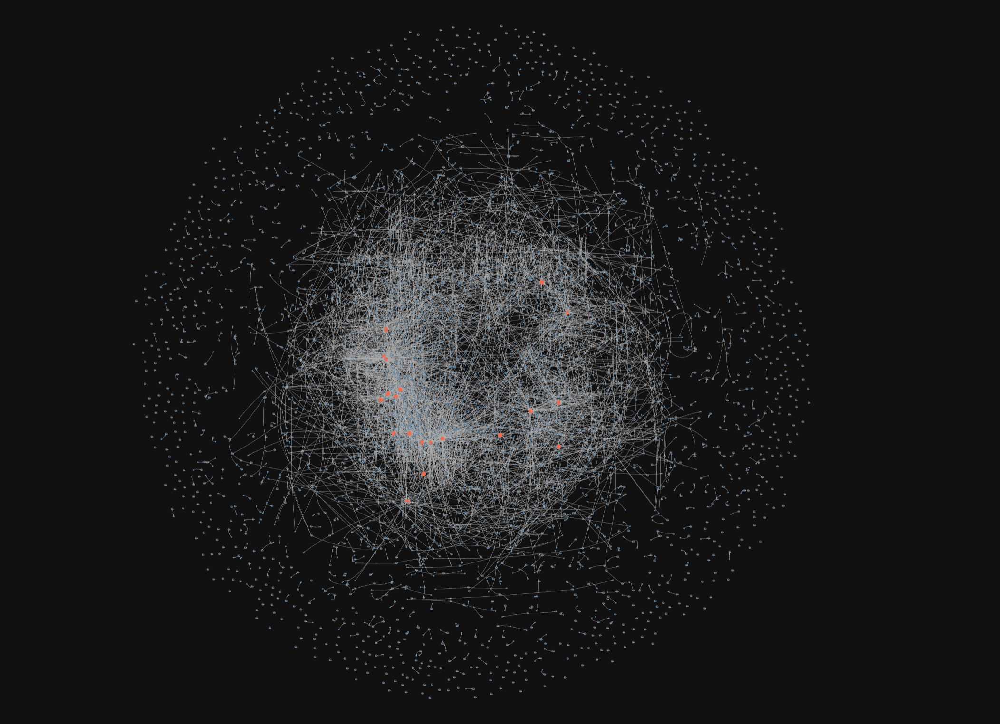

**Analysis & Key Findings:**

* **Influence in this dataset is primarily “attention concentration,” not “broadcast activity.”**
  The network-only top-20 is overwhelmingly driven by **in-degree**, meaning the most influential accounts are the ones **most frequently referenced/targeted by others** (mentions/retweets/replies directed at them). In business terms, these are the accounts that the conversation orbits around.

* **Two distinct influencer archetypes emerge: “Hubs” vs “Bridges.”**
  Most of the top-20 are **hubs** (high in-degree) that attract consistent engagement. A smaller subset ranks highly due to **betweenness**, acting as **bridges across clusters**. They may not have the largest audience volume, but they are structurally positioned to move information between communities.

* **Influencers align with the network core when we use interaction-based metrics.**
  In the full-network visualization, the highlighted top-20 nodes appear **inside/near the dense core**, indicating they are not just prominent accounts, they are **embedded in the active interaction ecosystem** observed in the data window.

* **Closeness contributes minimally, suggesting limited incremental value for prioritization here.**
  Closeness adds little separation among top accounts in this graph structure, implying that “being globally close to everyone” is not a key differentiator compared to **being a focal point (in-degree)** or a **connector (betweenness)**.

**Recommendations:**

* **Prioritize hub influencers for reach and sustained visibility.**
  High in-degree accounts are best suited for campaigns where the goal is maximizing exposure and engagement volume, since they already attract significant attention in the observed ecosystem.

* **Deploy bridge influencers to penetrate or connect audiences across communities.**
  High-betweenness accounts are ideal for **cross-segment diffusion**, narrative shifting, or campaigns needing **spillover across clusters** (e.g., moving a message from one interest group into another).

* **Use a dual-track influencer strategy (coverage + diffusion).**
  A practical activation approach is:

  1. **Hubs** to generate attention and establish credibility quickly, and
  2. **Bridges** to propagate the message beyond the core audience and reduce “echo chamber” effects.

* **Treat interaction influence as “contextual to the observed period/topic.”**
  This ranking reflects influence **within the captured conversation and timeframe**, which is valuable for near-term targeting and monitoring, but should be interpreted as topic/window-specific influence, not universal popularity.


--------------- End of the Report -------------------------